## Digital Project 

Text mining and NLP analysis on ‘The Quantified Self’ speeches transcripts. The project goal is to exlore the discourse of the presentations that people have given about their own self-research projects.

In [1]:
# numerical computation
import numpy as np
import math
from collections import Counter

#web-scrapping 
from bs4 import BeautifulSoup
import requests
from urllib3 import request


import warnings
warnings.filterwarnings("ignore",category=DeprecationWarning)


# data processing/manipulation
import pandas as pd
pd.options.mode.chained_assignment = None
import re
from unidecode import unidecode 
from pprint import pprint

# data visualization
import matplotlib.pyplot as plt
%matplotlib inline
from os import path
from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import plotly.express as px
import seaborn as sns
from matplotlib import rc
from matplotlib import gridspec
import pyLDAvis
import pyLDAvis.gensim
import pyLDAvis.sklearn

#for plotting images & adjusting colors
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from PIL import Image


# stopwords, tokenizer, stemmer
import nltk  
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import PorterStemmer
from nltk.probability import FreqDist
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.stem import WordNetLemmatizer 
from nltk.corpus import wordnet

# spell correction, lemmatization
from textblob import TextBlob
from textblob import Word

# sklearn
from sklearn.model_selection import train_test_split
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer

# Gensim
import gensim
import gensim.corpora as corpora
from gensim.utils import simple_preprocess
from gensim.models import CoherenceModel
from gensim.parsing.preprocessing import STOPWORDS
from gensim.parsing.preprocessing import remove_stopwords
from gensim.corpora import Dictionary 
from gensim.models.ldamodel import LdaModel


# spacy for NLP
import spacy
from spacy import displacy
import spacy.cli
spacy.cli.download("en")
from spacy.lang.en.stop_words import STOP_WORDS


# Enable logging for gensim - optional
import logging
logging.basicConfig(format='%(asctime)s : %(levelname)s : %(message)s', level=logging.ERROR)


/home/criuser/snap/jupyter/common/lib/python3.7/site-packages/joblib/_multiprocessing_helpers.py:45: UserWarning: [Errno 13] Permission denied.  joblib will operate in serial mode
  warnings.warn('%s.  joblib will operate in serial mode' % (e,))
/home/criuser/snap/jupyter/common/lib/python3.7/site-packages/scipy/sparse/sparsetools.py:21: DeprecationWarning: `scipy.sparse.sparsetools` is deprecated!
scipy.sparse.sparsetools is a private module for scipy.sparse, and should not be used.
  _deprecated()


✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')
✔ Linking successful
/home/criuser/snap/jupyter/common/lib/python3.7/site-packages/en_core_web_sm -->
/home/criuser/snap/jupyter/common/lib/python3.7/site-packages/spacy/data/en
You can now load the model via spacy.load('en')


In [3]:
import ssl

try:
    _create_unverified_https_context = ssl._create_unverified_context
except AttributeError:
    pass
else:
    ssl._create_default_https_context = _create_unverified_https_context

nltk.download()

NLTK Downloader
---------------------------------------------------------------------------
    d) Download   l) List    u) Update   c) Config   h) Help   q) Quit
---------------------------------------------------------------------------
Downloader> d

Download which package (l=list; x=cancel)?
  Identifier> punckt


    Error loading punckt: Package 'punckt' not found in index



---------------------------------------------------------------------------
    d) Download   l) List    u) Update   c) Config   h) Help   q) Quit
---------------------------------------------------------------------------
Downloader> punkt
Command 'punkt' unrecognized

---------------------------------------------------------------------------
    d) Download   l) List    u) Update   c) Config   h) Help   q) Quit
---------------------------------------------------------------------------
Downloader> d

Download which package (l=list; x=cancel)?
  Identifier> punkt


        /home/criuser/snap/jupyter/6/nltk_data...
      Package punkt is already up-to-date!



---------------------------------------------------------------------------
    d) Download   l) List    u) Update   c) Config   h) Help   q) Quit
---------------------------------------------------------------------------
Downloader> d

Download which package (l=list; x=cancel)?
  Identifier> averaged_perceptron_tagger


        /home/criuser/snap/jupyter/6/nltk_data...
      Package averaged_perceptron_tagger is already up-to-date!



---------------------------------------------------------------------------
    d) Download   l) List    u) Update   c) Config   h) Help   q) Quit
---------------------------------------------------------------------------
Downloader> d

Download which package (l=list; x=cancel)?
  Identifier> wordnet


        /home/criuser/snap/jupyter/6/nltk_data...
      Package wordnet is already up-to-date!



---------------------------------------------------------------------------
    d) Download   l) List    u) Update   c) Config   h) Help   q) Quit
---------------------------------------------------------------------------
Downloader> d

Download which package (l=list; x=cancel)?
  Identifier> stopwords


        /home/criuser/snap/jupyter/6/nltk_data...
      Package stopwords is already up-to-date!



---------------------------------------------------------------------------
    d) Download   l) List    u) Update   c) Config   h) Help   q) Quit
---------------------------------------------------------------------------


KeyboardInterrupt: 

In [4]:
# Reading original dataset
df = pd.read_csv('qs-show-and-tells - qs-show-and-tells.csv', header=None)
df.columns = ["URL", "Topics", "Tools", "Start of the speech", "Link to the video"]
df.head()

,URL,Topics,Tools,Start of the speech,Link to the video
0,https://quantifiedself.com/show-and-tell/?proj...,diet and weight loss | food tracking | spo...,Fitbit,NaN,https://player.vimeo.com/video/33565756?app_id...
1,https://quantifiedself.com/show-and-tell/?proj...,cognition | sports & fitness | mood & emotion,23andMe | coronary calcium scan | Fitbit | Ins...,Hello I’m Mark and I’m going to first publicly...,https://player.vimeo.com/video/96591409?app_id...
2,https://quantifiedself.com/show-and-tell/?proj...,mood & emotion | productivity | stress,self-report cognitive functioning,I’m Jenny and I’m going to talk to you about m...,https://player.vimeo.com/video/100583400?app_i...
3,https://quantifiedself.com/show-and-tell/?proj...,diet and weight loss | productivity | sleep,Excel | Fitbit | Moves | MyFitnessPal | Runkee...,I’m Kouris Kalligas. I run a startup called Ad...,https://player.vimeo.com/video/104559409?app_i...
4,https://quantifiedself.com/show-and-tell/?proj...,cognition | mood & emotion,SuperMemo,"grade in high school, I hear seemed it took li...",https://player.vimeo.com/video/101714344?app_i...


In [5]:
print('Total number of records in  dataset: ', df.shape)

Total number of records in  dataset:  (340, 5)


## Web-scrapping

In [321]:
transcripts = []
links  = df.URL.to_list()
for link in links:
  r = requests.get(link)
  c = r.content
  soup = BeautifulSoup(c)
  if soup.find('div', {'class' :'transcript'}) !=None:
    transcript = soup.find('div', {'class' :'transcript'}).text
    transcripts.append(transcript)
  else:
    transcripts.append(None)

In [322]:
transcripts_df['Transcripts'] = pd.DataFrame(transcripts)
transcripts_df

,0,Transcripts
0,Rob Portil Weight Loss & Muscle Gain with Fitb...,Rob Portil Weight Loss & Muscle Gain with Fitb...
1,Hello I’m Mark and I’m going to first publicly...,Hello I’m Mark and I’m going to first publicly...
2,I’m Jenny and I’m going to talk to you about m...,I’m Jenny and I’m going to talk to you about m...
3,I’m Kouris Kalligas. I run a startup called Ad...,I’m Kouris Kalligas. I run a startup called Ad...
4,Steven Jonas Memorizing My Dayboook Hello ever...,Steven Jonas Memorizing My Dayboook Hello ever...
...,...,...
335,Justin LawlerTracking Glucose as a Person With...,Justin LawlerTracking Glucose as a Person With...
336,I’m Thomas Blomseth Christiansen and I will ta...,I’m Thomas Blomseth Christiansen and I will ta...
337,Mikey Sklar Three Marathons on Zero CaloriesHi...,Mikey Sklar Three Marathons on Zero CaloriesHi...
338,None,None


### Splitting the columns Topics and Tools

In [323]:
df3 = df.Topics.str.split("|", expand=True,)
df3.columns =['Topic1', 'Topic2', 'Topic3', 'Topic4'] 
df3.head()

,Topic1,Topic2,Topic3,Topic4
0,diet and weight loss,food tracking,sports & fitness,None
1,cognition,sports & fitness,mood & emotion,None
2,mood & emotion,productivity,stress,None
3,diet and weight loss,productivity,sleep,None
4,cognition,mood & emotion,None,None


In [324]:
df4 = df.Tools.str.split("|", expand=True,)
df4.columns =['Tool1', 'Tool2', 'Tool3', 'Tool4', 'Tool5', 'Tool6', 'Tool7'] 
df4.head()

,Tool1,Tool2,Tool3,Tool4,Tool5,Tool6,Tool7
0,Fitbit,None,None,None,None,None,None
1,23andMe,coronary calcium scan,Fitbit,Insidetracker,neuropsychology testing,self-report cognitive functioning,None
2,self-report cognitive functioning,None,None,None,None,None,None
3,Excel,Fitbit,Moves,MyFitnessPal,Runkeeper,SleepCycle,Withings Scale
4,SuperMemo,None,None,None,None,None,None


## Creating te final dataframe 

In [326]:
df_final = pd.concat([df, df3, df4, transcripts_df.Transcripts], axis=1)
irrelevant_columns = ['Tools', 'Topics', 'Start of the speech', 'Link to the video', 'URL']
df_final = df_final.drop(columns=irrelevant_columns)
df_final.head()

,Topic1,Topic2,Topic3,Topic4,Tool1,Tool2,Tool3,Tool4,Tool5,Tool6,Tool7,Transcripts
0,diet and weight loss,food tracking,sports & fitness,None,Fitbit,None,None,None,None,None,None,Rob Portil Weight Loss & Muscle Gain with Fitb...
1,cognition,sports & fitness,mood & emotion,None,23andMe,coronary calcium scan,Fitbit,Insidetracker,neuropsychology testing,self-report cognitive functioning,None,Hello I’m Mark and I’m going to first publicly...
2,mood & emotion,productivity,stress,None,self-report cognitive functioning,None,None,None,None,None,None,I’m Jenny and I’m going to talk to you about m...
3,diet and weight loss,productivity,sleep,None,Excel,Fitbit,Moves,MyFitnessPal,Runkeeper,SleepCycle,Withings Scale,I’m Kouris Kalligas. I run a startup called Ad...
4,cognition,mood & emotion,None,None,SuperMemo,None,None,None,None,None,None,Steven Jonas Memorizing My Dayboook Hello ever...


In [327]:
# Saving to csv file
df_final.to_csv('final_data.csv', index=False)  

## EDA topics and tools

In [335]:
## Looking for the unique topics in the dataframe
topics_unique = pd.unique(df_final[["Topic1", "Topic2", "Topic3", "Topic4"]].values.ravel())

In [336]:
topics_df['Topics'] = pd.DataFrame(topics_unique)
topics_df

,0,Topics
0,diet and weight loss,diet and weight loss
1,food tracking,food tracking
2,sports & fitness,sports & fitness
3,None,None
4,cognition,cognition
...,...,...
57,environment,environment
58,location,location
59,other,other
60,metabolism,metabolism


In [332]:
# Transforming to list and string 
topics_list = topics_df.Topics.tolist()
topics_text = str(topics_list)
sw_list = ["None", "'\\xa0", "\\xa0"]

topics_tokens = word_tokenize(topics_text)
topics_tokens = [word for word in topics_tokens if not word in sw_list]

In [333]:
# using list comprehension 
listToStr1= ' '.join(map(str, topics_tokens)) 
listToStr1

"[ 'diet and weight loss ' , food tracking ' , sports & fitness ' , nan , 'cognition ' , sports & fitness ' , mood & emotion ' , 'mood & emotion ' , productivity ' , stress ' , sleep ' , genome & microbiome ' , 'productivity ' , social life & social media ' , metabolism ' , 'productivity ' , 'sleep ' , food tracking ' , 'food tracking ' , productivity ' , 'food tracking ' , 'cognition ' , 'metabolism ' , heart rate / cardiovascular ' , 'mood & emotion ' , 'social life & social media ' , 'diet and weight loss ' , 'metabolism ' , 'heart rate / cardiovascular ' , 'stress ' , 'chronic condition ' , sleep ' , 'sports & fitness ' , 'media ' , mood & emotion ' , diet and weight loss ' , heart rate / cardiovascular ' , 'chronic condition ' , 'heart rate / cardiovascular ' , 'social life & social media ' , 'sports & fitness ' , 'money ' , 'sleep ' , diet and weight loss ' , 'genome & microbiome ' , media ' , 'media ' , 'ovulatory cycle & pregnancy ' , 'genome & microbiome ' , 'money ' , 'other 

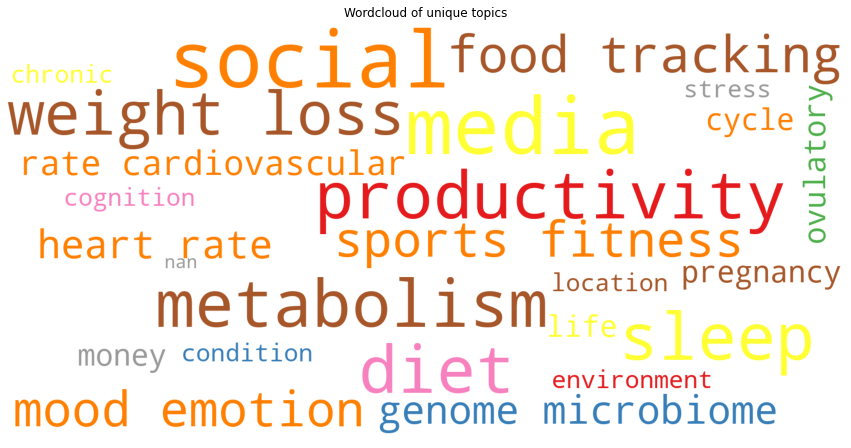

In [334]:
# Create and generate a word cloud image:
wordcloud = WordCloud(width=1600, height=800, max_font_size=150, max_words=100, colormap='Set1', collocations=True, background_color="white").generate(listToStr1)

# Display the generated image:
plt.figure(figsize=(15,10))
plt.imshow(wordcloud)
plt.title('Wordcloud of unique topics')
plt.axis("off")
plt.show()

In [252]:
## Looking for the unique topics in the dataframe
tools_unique = pd.unique(df_final[["Tool1", "Tool2", "Tool3", "Tool4", "Tool5", "Tool6", "Tool7"]].values.ravel())

In [253]:
tools_df['Tools']= pd.DataFrame(tools_unique)
tools_df

,0,Tools
0,Fitbit,Fitbit
1,None,None
2,23andMe,23andMe
3,coronary calcium scan,coronary calcium scan
4,Fitbit,Fitbit
...,...,...
305,Fitbit One,Fitbit One
306,Garmin Fenix 6S,Garmin Fenix 6S
307,Garmin Oregon 450,Garmin Oregon 450
308,Garmin Tempe,Garmin Tempe


In [238]:
# Transforming to list and string 
tools_list = tools_df.Tools.tolist()
tools_text = str(tools_list)
sw_list = ["None", "'\\xa0", "\\xa0"]

tools_tokens = word_tokenize(tools_text)
tools_tokens = [word for word in tools_tokens if not word in sw_list]

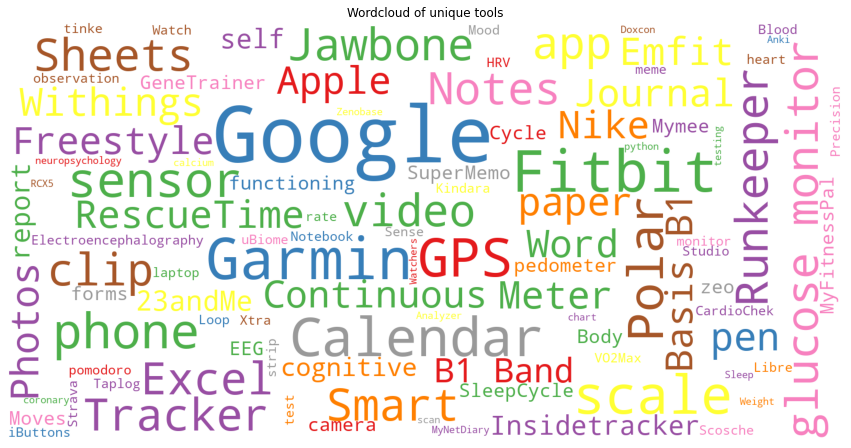

In [240]:
# using list comprehension 
listToStr2= ' '.join(map(str, tools_tokens)) 
# Create and generate a word cloud image:
wordcloud = WordCloud(width=1600, height=800, max_font_size=150, max_words=100, colormap='Set1', background_color="white", collocations=True).generate(listToStr2)

# Display the generated image:
plt.figure(figsize=(15,10))
plt.imshow(wordcloud)
plt.title('Wordcloud of unique tools')
plt.axis("off")
plt.show()

## Preparing the text for analysis

In [99]:
'''
Helper function that:
    - removes accents
    - removes stopwords
    - removes punctuation
'''

def clean_text(text):
    # remove accents of text
    text=unidecode(text)
    # lowercase
    text=text.lower()
    text=re.sub(r'@[A-Za-z0-9]+','',text) #remove mentions of other twitter accounts (remove the whole user name)
    text=re.sub(r'#','',text) # remove the hashtag symbol (but leaves the hashtag word)
    text=re.sub(r'RT[\s]+','',text)
    text=re.sub(r'https?:\/\/\S+','',text) # removes hyperlinks
    text=re.sub(r'[^\w]', ' ', text)

    # remove stopwords
    text=remove_stopwords(text)
    
    '''
    remove any 1 or 2 letter entities that remain in a text after automatically removing the apostrophes 
    [d, f, i, m, s, t, u, y]
    [el, en, la, ll, pa, ve]
    '''
    text = re.sub(r"\sd\s", " ", text)
    text = re.sub(r"\sf\s", " ", text)
    text = re.sub(r"\si\s", " ", text)
    text = re.sub(r"\sm\s", " ", text)
    text = re.sub(r"\ss\s", " ", text)
    text = re.sub(r"\st\s", " ", text)
    text = re.sub(r"\su\s", " ", text)
    text = re.sub(r"\sy\s", " ", text)    
    text = re.sub(r"\sel\s", " ", text)
    text = re.sub(r"\sen\s", " ", text)
    text = re.sub(r"\sla\s", " ", text)
    text = re.sub(r"\sll\s", " ", text)
    text = re.sub(r"\spa\s", " ", text)    
    text = re.sub(r"\sve\s", " ", text)
    
    return text

In [86]:
lemmatizer = WordNetLemmatizer()

# function to convert nltk tag to wordnet tag
def nltk_tag_to_wordnet_tag(nltk_tag):
    if nltk_tag.startswith('J'):
        return wordnet.ADJ
    elif nltk_tag.startswith('V'):
        return wordnet.VERB
    elif nltk_tag.startswith('N'):
        return wordnet.NOUN
    elif nltk_tag.startswith('R'):
        return wordnet.ADV
    else:          
        return None
        
# Lemmatization function
def lemmatize_sentence(sentence):
    #tokenize the sentence and find the POS tag for each token
    nltk_tagged = nltk.pos_tag(nltk.word_tokenize(sentence))  
    #tuple of (token, wordnet_tag)
    wordnet_tagged = map(lambda x: (x[0], nltk_tag_to_wordnet_tag(x[1])), nltk_tagged)
    lemmatized_sentence = []
    for word, tag in wordnet_tagged:
        if tag is None:
            #if there is no available tag, append the token as is
            lemmatized_sentence.append(word)
        else:        
            #else use the tag to lemmatize the token
            lemmatized_sentence.append(lemmatizer.lemmatize(word, tag))
    return " ".join(lemmatized_sentence)

In [87]:
# Tokenizing words
def tokenize_text(tweet):
    filtered_tweet = []
    words = word_tokenize(tweet) 

    for word in words:
        filtered_tweet.append(word)
                
    return filtered_tweet

In [89]:
# Transforming to list and string 
transcripts_list = transcripts_df.Transcripts.tolist()
transcripts_text = str(transcripts_list)

In [90]:
# Cleaning texts 
cleaned_text = clean_text(transcripts_text)
# Lemmatizing texts
lemm_text = lemmatize_sentence(cleaned_text)
# Tokenizing texts
token_text = tokenize_text(lemm_text)

In [178]:
# Deleting additional spoken language stopwords
all_stopwords = stopwords.words('english')
sw_list = ['basically','like', 'know','actually','things', 'going','lot','want','thing','got','way','little','bit','go','try', 'get','look','make','let','kind','way','say','need','day','week','month','year','come','back','take','use','pretty', 'actually','lot','maybe']
all_stopwords.extend(sw_list)

text_tokens = word_tokenize(lemm_text)
tokens_without_sw = [word for word in text_tokens if not word in all_stopwords]

In [45]:
# Frequency Distribution Plot
fdist = FreqDist(tokens_without_sw)
df_fdist = pd.DataFrame(fdist.items(), columns=['word', 'frequency'])

#top 20 words 
df_fdist20 = df_fdist.sort_values(['frequency'], ascending=False).head(30)

Text(0.5, 1.0, 'TOP 20 frequent words which occurred the texts')

<Figure size 1440x720 with 0 Axes>

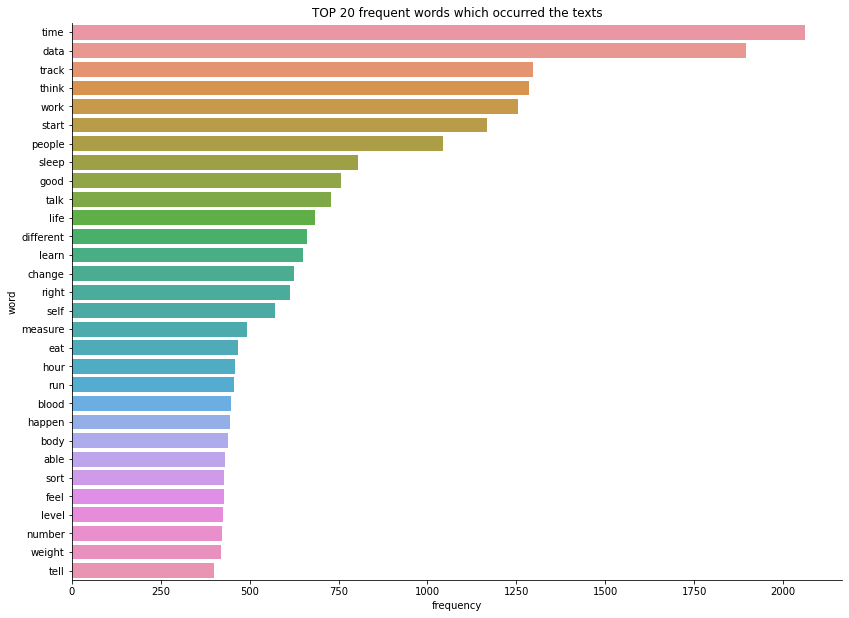

In [46]:
#ploting top 20 words 
plt.figure(figsize=(20,10))
sns.catplot(y="word", x="frequency", kind="bar", data=df_fdist20, height=8.27, aspect=11.7/8.27)
plt.title('TOP 20 frequent words which occurred the texts')

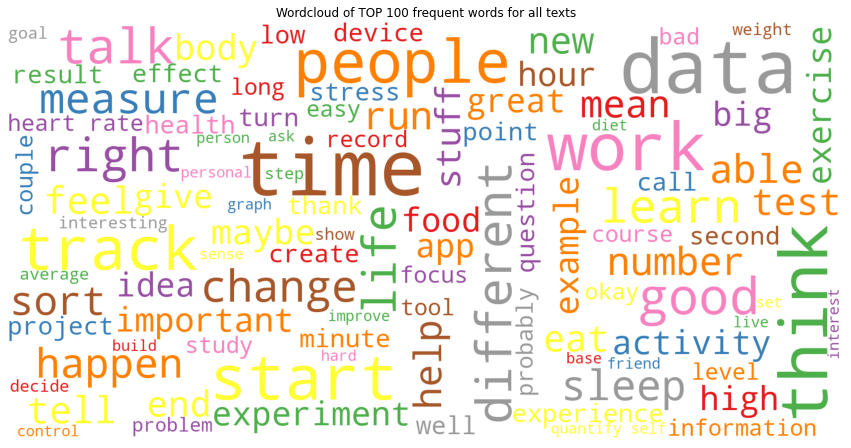

In [160]:
# using list comprehension 
listToStr= ' '.join(map(str, tokens_without_sw)) 
# Create and generate a word cloud image:
wordcloud = WordCloud(width=1600, height=800, max_font_size=150, max_words=100, colormap='Set1', background_color="white", collocations=True).generate(listToStr)

# Display the generated image:
plt.figure(figsize=(15,10))
plt.imshow(wordcloud)
plt.title('Wordcloud of TOP 100 frequent words for all texts')
plt.axis("off")
plt.show()

Text(0.5, 1.0, 'TOP 20 pair of words which occurred the texts')

<Figure size 1440x720 with 0 Axes>

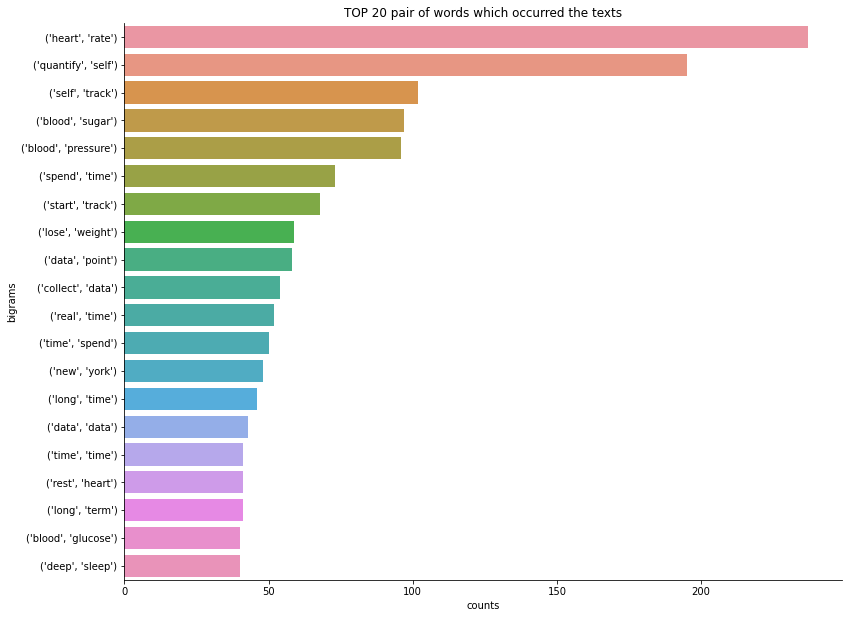

In [48]:
#top 20 bigrams 
bigrams_series = (pd.Series(nltk.ngrams(tokens_without_sw, 2)).value_counts())[:20]
bigrams_top = pd.DataFrame(bigrams_series.sort_values(ascending=False))
bigrams_top = bigrams_top.reset_index().rename(columns={'index': 'bigrams', 0:'counts'})
plt.figure(figsize=(20,10))
sns.catplot(x = 'counts' , y='bigrams', kind="bar", data=bigrams_top, height=8.27, aspect=11.7/8.27)
plt.title('TOP 20 pair of words which occurred the texts')

Text(0.5, 1.0, 'TOP 20 trigrams of words which occurred the texts')

<Figure size 1440x720 with 0 Axes>

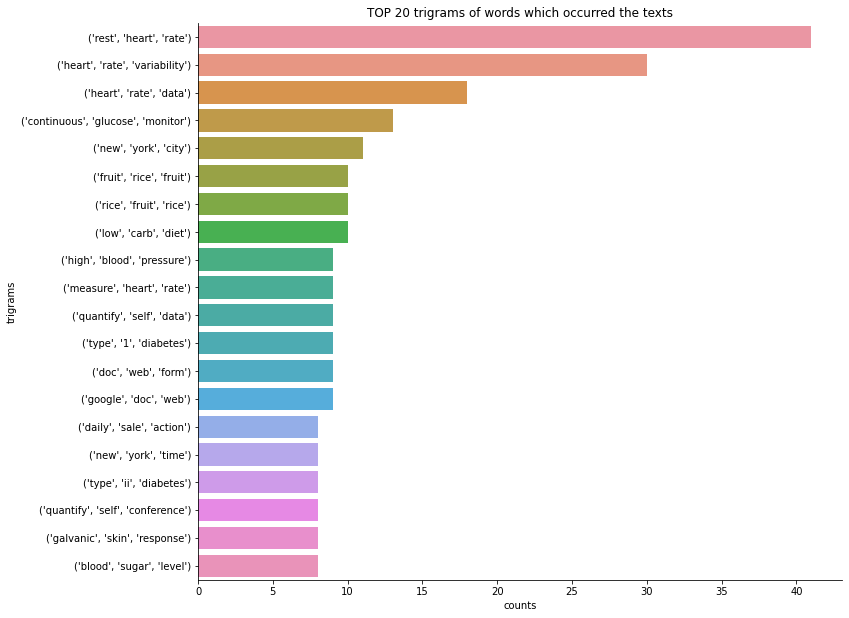

In [161]:
#top 20 trigrams
trigrams_series = (pd.Series(nltk.ngrams(tokens_without_sw, 3)).value_counts())[:20]
trigrams_top = pd.DataFrame(trigrams_series.sort_values(ascending=False))
trigrams_top = trigrams_top.reset_index().rename(columns={'index': 'trigrams', 0:'counts'})
trigrams_top
plt.figure(figsize=(20,10))
sns.catplot(x = 'counts' , y='trigrams', kind="bar", data=trigrams_top, height=8.27, aspect=11.7/8.27)
plt.title('TOP 20 trigrams of words which occurred the texts')

## Topic modeling 

In [49]:
# Vectorization 
vectorizer = CountVectorizer(analyzer='word',       
min_df=3,# minimum required occurences of a word 
stop_words='english',# remove stop words
lowercase=True,# convert all words to lowercase
token_pattern='[a-zA-Z0-9]{3,}',# num chars > 3
max_features=5000,# max number of unique words
)

In [50]:
# Creating the matrix
data_matrix = vectorizer.fit_transform(tokens_without_sw)

In [180]:
# Building the model
lda_model = LatentDirichletAllocation(
n_components=5, # Number of topics
learning_method='online',
random_state=62,       
n_jobs = -1  # Use all available CPUs
)

lda_output = lda_model.fit_transform(data_matrix)

In [181]:
# Topics visualization
pyLDAvis.enable_notebook()
viz = pyLDAvis.sklearn.prepare(lda_model, data_matrix, vectorizer, mds='tsne')
viz

PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
1      150.222153  -72.269554       1        1  20.059593
2       51.163364 -159.968018       2        1  20.015053
4      -73.144554   21.523815       3        1  20.004303
3      -66.410133 -110.606438       4        1  19.975501
0       54.417324   12.443444       5        1  19.945549, topic_info=            Term         Freq        Total Category  logprob  loglift
4396        time  2065.000000  2065.000000  Default  30.0000  30.0000
1169        data  1854.000000  1854.000000  Default  29.0000  29.0000
4443       track  1253.000000  1253.000000  Default  28.0000  28.0000
4371       think  1209.000000  1209.000000  Default  27.0000  27.0000
4778        work  1197.000000  1197.000000  Default  26.0000  26.0000
...          ...          ...          ...      ...      ...      ...
184          ago   171.310982   172.083084   Topic5  -5.0214   1.6077
3532     realize   165.083549   165.855676   Topic5  -5.0585   1.6075
690      calorie   143.784353   144.556456   Topic5  -5.1966   1.6068
2325  interested   140.714314   141.486412   Topic5  -5.2182   1.6067
3626    remember   136.517390   137.289492   Topic5  -5.2485   1.6065

[180 rows x 6 columns], token_table=      Topic      Freq        Term
term                             
86        5  0.999129        able
133       2  0.998460    activity
143       3  0.993380         add
184       5  0.993706         ago
293       1  0.997960         app
...     ...       ...         ...
4553      1  0.997651  understand
4723      5  0.997422      weight
4775      2  0.993670        word
4778      3  0.999085        work
4804      1  0.996759       write

[150 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[2, 3, 5, 4, 1])

In [182]:
pyLDAvis.save_html(viz, 'lda.html')

In [255]:
# Visualization of the TOP 10 words for each topic
for i,topic in enumerate(lda_model.components_):
    print(f'Top 10 words for topic #{i + 1}:')
    print([vectorizer.get_feature_names()[i] for i in topic.argsort()[-10:]])
    print('\n')

Top 10 words for topic #1:
['experience', 'glucose', 'end', 'long', 'weight', 'happen', 'able', 'blood', 'run', 'track']


Top 10 words for topic #2:
['heart', 'tell', 'eat', 'change', 'different', 'talk', 'sleep', 'people', 'data', 'time']


Top 10 words for topic #3:
['question', 'point', 'test', 'feel', 'body', 'number', 'level', 'measure', 'hour', 'self']


Top 10 words for topic #4:
['project', 'diet', 'stuff', 'experiment', 'important', 'maybe', 'mean', 'new', 'sort', 'life']


Top 10 words for topic #5:
['focus', 'help', 'rate', 'high', 'right', 'learn', 'good', 'start', 'work', 'think']




In [61]:
# Adding the topics to the dataframe
topic_values = lda_model.transform(data_matrix)
#df_final['Topic_LDA'] = topic_values.argmax(axis=1)

## NLP

In [147]:
nlp = spacy.load("en_core_web_sm")

In [148]:
nlp.max_length = 15000000

In [149]:
doc = nlp(transcripts_text)

In [260]:
ents = [(e.text, e.label_) for e in doc.ents]
print(ents)

[('Rob Portil Weight Loss & Muscle Gain', 'ORG'), ('one', 'CARDINAL'), ('25 pounds', 'QUANTITY'), ('10', 'CARDINAL'), ('15 pounds', 'QUANTITY'), ('10 pounds', 'QUANTITY'), ('five pounds', 'QUANTITY'), ('six months', 'DATE'), ('many years', 'DATE'), ('66 years old', 'DATE'), ('165 pounds', 'QUANTITY'), ('155 pounds', 'QUANTITY'), ('all day long', 'DATE'), ('night', 'TIME'), ('less than 60 seconds', 'TIME'), ('the day', 'DATE'), ('just takes seconds', 'TIME'), ('166 pounds', 'QUANTITY'), ('155 pounds', 'QUANTITY'), ('155 pounds', 'QUANTITY'), ('34', 'CARDINAL'), ('33', 'CARDINAL'), ('Timothy Ferris’s', 'PERSON'), ('For Our Body', 'WORK_OF_ART'), ('two 30 minute', 'TIME'), ('an hour', 'TIME'), ('four hours', 'TIME'), ('less than 30 minutes', 'TIME'), ('a minute and a half, two minutes', 'TIME'), ('155 pounds', 'QUANTITY'), ('160 pounds', 'QUANTITY'), ('32', 'CARDINAL'), ('an inch', 'QUANTITY'), ('Quantified Self', 'ORG'), ('daily', 'DATE'), ('a couple of weeks', 'DATE'), ('between a coupl

In [273]:
# Creating the entities dataframe
entity_df = pd.DataFrame(ents)
entity_df.columns = ['Token', 'Entity']
entity_df

,Token,Entity
0,Rob Portil Weight Loss & Muscle Gain,ORG
1,one,CARDINAL
2,25 pounds,QUANTITY
3,10,CARDINAL
4,15 pounds,QUANTITY
...,...,...
14966,100,CARDINAL
14967,200,CARDINAL
14968,this New Year’s Eve,EVENT
14969,six day,DATE


In [274]:
# Looking for unique values - the categories of entities 
entity_df.Entity.unique()

array(['ORG', 'CARDINAL', 'QUANTITY', 'DATE', 'TIME', 'PERSON',
       'WORK_OF_ART', 'LOC', 'NORP', 'PERCENT', 'ORDINAL', 'GPE', 'FAC',
       'PRODUCT', 'MONEY', 'EVENT', 'LANGUAGE', 'LAW'], dtype=object)

In [289]:
# Entity by Persons
n_by_person = entity_df.loc[entity_df["Entity"] == "PERSON"]
n_by_person.head(20)

,Token,Entity
22,Timothy Ferris’s,PERSON
61,Mark,PERSON
69,Mark,PERSON
72,Inside Tracker,PERSON
73,Inside Tracker,PERSON
112,Resveratrol,PERSON
113,Statin,PERSON
118,Resveratrol,PERSON
127,Huxley,PERSON
128,Philip Caddick,PERSON


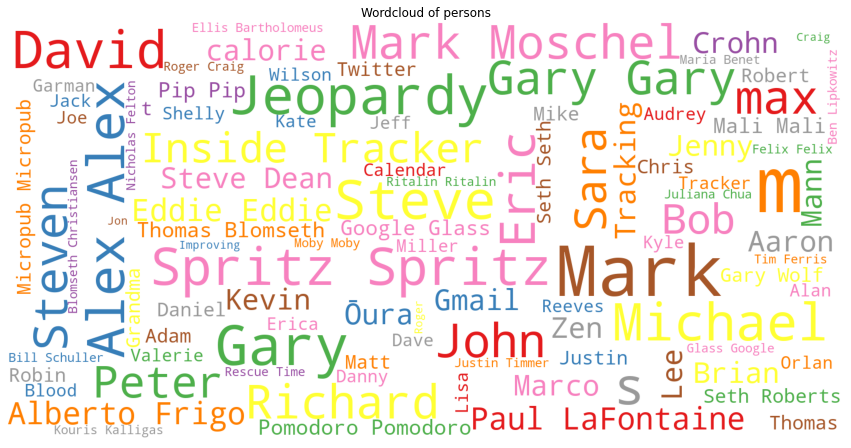

In [292]:
# TVisualization with wordcloud
person_list = n_by_person.Token.tolist()
person_text = str(person_list)
person_tokens = word_tokenize(person_text)
listToStr4= ' '.join(map(str, person_tokens)) 
# Create and generate a word cloud image:
wordcloud = WordCloud(width=1600, height=800, max_font_size=150, max_words=100, colormap='Set1', background_color="white", collocations=True).generate(listToStr4)

# Display the generated image:
plt.figure(figsize=(15,10))
plt.imshow(wordcloud)
plt.title('Wordcloud of persons')
plt.axis("off")
plt.show()

In [282]:
# Entity by Events
n_by_event = entity_df.loc[entity_df["Entity"] == "EVENT"]
n_by_event.head(20)

,Token,Entity
617,Thanksgiving,EVENT
654,the New Year’s,EVENT
1983,Paleo,EVENT
2163,the 2012 London Olympics,EVENT
2175,the Atlanta Olympics,EVENT
2178,Olympics,EVENT
2217,Olympics,EVENT
2287,Super Bowl,EVENT
4916,New Year,EVENT
5077,New Year,EVENT


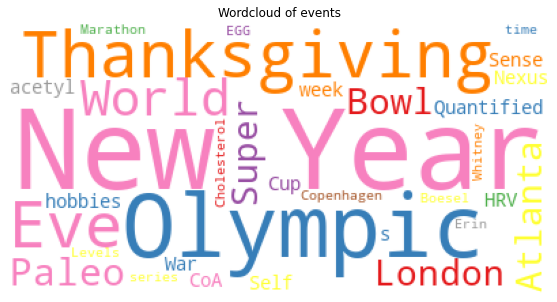

In [307]:
event_list = n_by_event.Token.tolist()
event_text = str(event_list)
sw_list = ["S","s","II", "\\xa0"]
event_tokens = word_tokenize(event_text)

event_tokens = [word for word in event_tokens if not word in sw_list]

# using list comprehension 
listToStr5= ' '.join(map(str, event_tokens)) 
# Create and generate a word cloud image:
wordcloud = WordCloud(max_font_size=150, max_words=100, colormap='Set1', background_color="white", collocations=True).generate(listToStr5)

# Display the generated image:
plt.figure(figsize=(10,5))
plt.imshow(wordcloud)
plt.title('Wordcloud of events')
plt.axis("off")
plt.show()

In [283]:
# Entity by Products
n_by_product = entity_df.loc[entity_df["Entity"] == "PRODUCT"]
n_by_product.head(20

,Token,Entity
149,Excel,PRODUCT
158,Excel,PRODUCT
299,Excel,PRODUCT
301,Diet Coke,PRODUCT
325,Excel,PRODUCT
326,Excel,PRODUCT
328,Excel,PRODUCT
444,Samantha,PRODUCT
522,Excel,PRODUCT
524,Excel,PRODUCT


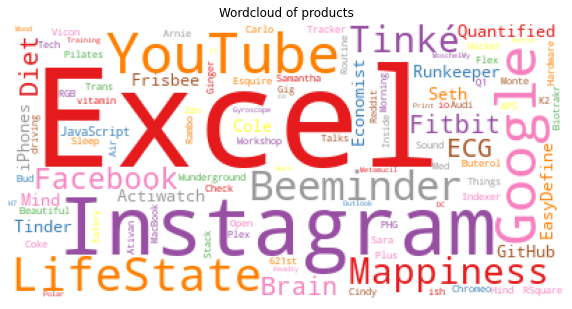

In [311]:
product_list = n_by_product.Token.tolist()
product_text = str(product_list)
product_tokens = word_tokenize(product_text)
# using list comprehension 
listToStr6= ' '.join(map(str, product_tokens)) 
# Create and generate a word cloud image:
wordcloud = WordCloud(max_font_size=100, max_words=100, colormap='Set1', background_color="white", collocations=True).generate(listToStr6)

# Display the generated image:
plt.figure(figsize=(10,8))
plt.imshow(wordcloud)
plt.title('Wordcloud of products')
plt.axis("off")
plt.show()

In [284]:
# Entity by Works of art
n_by_art = entity_df.loc[entity_df["Entity"] == "WORK_OF_ART"]
n_by_art.head(20)

,Token,Entity
23,For Our Body,WORK_OF_ART
38,the Fitbit,WORK_OF_ART
392,Daily Wellbeing Tracking,WORK_OF_ART
460,Rosane Oliveira on the Quantified Double Self:...,WORK_OF_ART
548,Yasmin Lucero on Baby Tracking,WORK_OF_ART
596,Tone Fonseca How to Win a Food Fight,WORK_OF_ART
766,the Tournament of Champions,WORK_OF_ART
896,Exploring and Visualizing Diabetes DataI’m Jana,WORK_OF_ART
922,Dawn,WORK_OF_ART
1025,Ph.D.,WORK_OF_ART


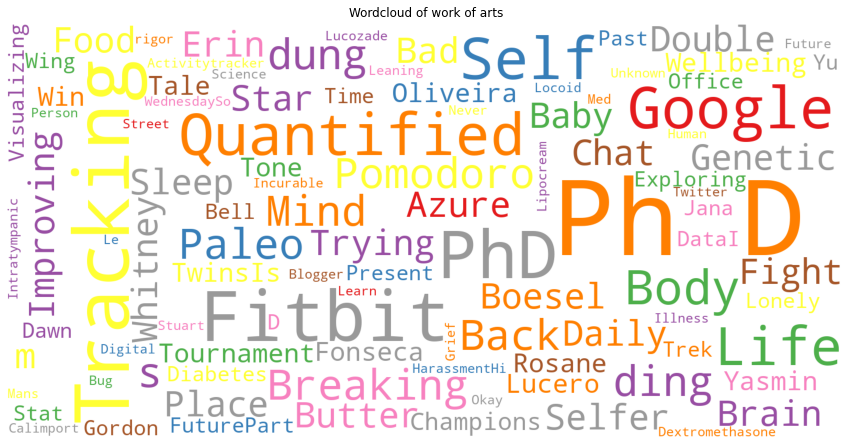

In [312]:
# Transforming to list and string 
art_list = n_by_art.Token.tolist()
art_text = str(art_list)
art_tokens = word_tokenize(art_text)
# using list comprehension 
listToStr7= ' '.join(map(str, art_tokens)) 
# Create and generate a word cloud image:
wordcloud = WordCloud(width=1600, height=800, max_font_size=200, max_words=100, colormap='Set1', background_color="white", collocations=True).generate(listToStr7)

# Display the generated image:
plt.figure(figsize=(15,10))
plt.imshow(wordcloud)
plt.title('Wordcloud of work of arts')
plt.axis("off")
plt.show()

In [157]:
# Visualization of the entities in the text
Vdisplacy.render(doc, style='ent', jupyter=True)